# 2015 - 2017 Clustering of Crime Statistics in Nashville and Davidson County 

Metro Nashville Police Department Incidents: https://data.nashville.gov/Police/Metro-Nashville-Police-Department-Incidents/2u6v-ujjs

motivation and problem definition

related work and background

your methodology (e.g., with flowcharts and code sections)

your results

summary

conclusions	

Resources
- Nashville map recieved from: https://www.openstreetmap.org/export#map=11/36.1509/-86.8250

In [177]:
!pip install pandas
!pip install numpy
!pip install matplotlib
!pip install hdbscan

In [178]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt

nashville = plt.imread('nashville.png')

Here is where I automatically load in the Incidents data from my google drive 

In [179]:
import requests
import sys
years = [x+2015 for x in range(8)]
urls = ['https://drive.google.com/file/d/1LTYiJ7jRD349_AotdS_bK1APh7ZrCah6/view?usp=sharing',
        'https://drive.google.com/file/d/1GzjgqE3WadAPDg6-iWXU5SHJHeTRJBa1/view?usp=sharing',
        'https://drive.google.com/file/d/1Tfi88J6t85WqmzYsIvl4jQIvY17uRDKK/view?usp=sharing',
        'https://drive.google.com/file/d/1Sah-YHED0cZ572kKNy6SYSk_A77B42jV/view?usp=sharing',
        'https://drive.google.com/file/d/18OwQEW7C0L9sECf6eBpvhNjC_Warxk5W/view?usp=sharing',
        'https://drive.google.com/file/d/1y8ne0qUyNSJZN-pXooT7O3gJWelBihit/view?usp=sharing',
        'https://drive.google.com/file/d/1a6K89d20qgI2UkxO7vJqLxWMVFEz_Wep/view?usp=sharing',
        'https://drive.google.com/file/d/1M6Hq0qQH2N6JvymSwcn3pruYAX2IMreU/view?usp=sharing'
       ]
for url,year in zip(urls,years):
    url='https://drive.google.com/uc?id=' + url.split('/')[-2]
    df = pd.read_csv(url)
    df.to_csv(str(year) + 'Incidents.csv', encoding='utf-8')

NOTE: file was to large to download from google drive, so I seperated into the years and uploaded to drive, so this process data is not needed.  

Here I process the data by removing all null or zeroed mapped locations and then separate the data by year for an annual analysis later. 

In [180]:
def processData(): 
    incidents = pd.read_csv('Incidents.csv')
    incidents.dropna(inplace=True, subset=["Mapped Location"])
#   Some incidents have non-null mapped locations, but lat and long of 0
#   So we remove those values
    incidents = incidents[incidents['Latitude'] != 0]
    years = [x+2015 for x in range(8)]

    incidents['Incident Occurred'] = pd.to_datetime(incidents['Incident Occurred'])

    for year in years:
        maskIncidents = (incidents['Incident Occurred'] > str(year) + "-01-01") & (incidents['Incident Occurred'] <= str(year) + "-12-31")

        tmpIncidents = incidents.loc[maskIncidents]
        tmpIncidents.to_csv(str(year) + 'Incidents.csv', encoding='utf-8')

Helper functions for fetching and dividing up the data for further analysis

In [181]:
# Will load in the selected year of incidents.
def fetchYearOfIncidents(year):
    return pd.read_csv(str(year) + 'Incidents.csv')

# Will divide the given incidents based on the type of crime and return each. 
def divideByCrimeType(incidents):
    violentCodes = ['100', '11A', '13A', '13A', '13B', '13c', '13C', '09A', '09B', '09C', '210','11B','220', '695']
    theftCodes = ['120','220','23A','23B','23C','23D','23E','23F','23G','23H','240','26A','520','780']
    nonViolentCodes = ['13D', '200', '250','26B','26C','26D','26E','26F','26G','270','280','290','370','40A','40B','40C','510','620','720','850','90C','90D','90E','90F','90J','90H','35A','35B','39A','39B','39C','39D']
    
    print('all incidents shape: ', incidents.shape)
    violent = incidents.loc[incidents['Offense NIBRS'].isin(violentCodes)]
    print('Violent incidents shape: ', violent.shape)
    theft = incidents.loc[incidents['Offense NIBRS'].isin(theftCodes)]
    print('theft incidents shape: ', theft.shape)
    nonViolent = incidents.loc[incidents['Offense NIBRS'].isin(nonViolentCodes)]
    print('Non-Violent incidents shape: ', nonViolent.shape)
    
    return (violent, nonViolent, theft)

# incidents = pd.read_csv('Incidents.csv')

# calls = pd.read_csv('Calls.csv')

Breaking down both the datasets into yearly sections, from 2015 to 2022. 

In [182]:
# incidents = pd.read_csv('2016Incidents.csv')
# calls = pd.read_csv('2016Calls.csv')


# print(f'Rows in incidents: {incidents.shape[0]}')
# print(f'Rows in calls: {calls.shape[0]}')

# print(f'')
# print("Non-NA entries in columns of incidents:")
# print(incidents.count())
# print("Non-NA entries in columns of calls:")
# print(calls.count())

# incidents.dropna(inplace=True, subset=["Mapped Location"])

# print(f'Rows in incidents: {incidents.shape[0]}')
# print(f'Rows in calls: {calls.shape[0]}')

# print(f'')
# print("Non-NA entries in columns of incidents:")
# print(incidents.count())
# print("Non-NA entries in columns of calls:")
# print(calls.count())

# incidents = pd.read_csv('reduced_incidents.csv')

# calls = pd.read_csv('reduced_calls.csv')

In [183]:
# print(f'features of Incidents: ')
# for col in incidents.columns:
#     print(col + ' | ', end='')

In [184]:
# print(incidents['Victim Race'].unique())
# print(incidents['Victim Ethnicity'].unique())
# print(incidents['Offense Description'].unique())
# print(incidents['Offense NIBRS'].unique())
# print(calls['Unit Dispatched'].unique())

Divided the offense codes into 3 categories: violent, theft, non-violent


Violent and theft both include aggrevated assault as violence is threated. Theft excludes offenses such as fraud of credit card/check, gov program fraud, identity theft excluded, etc., which are included in the non-violent category. The left over offense codes not used in this analysis include natural/accidental death, suicide, non-crimes (found property, policy inquiry, etc.). 

Code below this cell was purely for generated a reference to the descriptions of each crime in each category. 

Violent incidents Description:  ['BURGLARY- AGGRAVATED' 'SIMPLE ASSLT'
 'ASSAULT- OFFENSIVE OR PROVOCATIVE CONTACT'
 'Assault, Aggravated - Deadly Weapon - Int/Kn'
 'INTENTIONAL AGGRAVATED ASSAULT' 'BURGLARY - AGGRAVATED'
 'ASSAULT- FEAR OF BODILY INJURY' 'THREAT TO BOMB'
 'AGGRAV ASSLT - NONFAMILY-GUN'
 'SIMPLE ASSLT - STRANGULATION (NO LOSS OF CONSCIOUSNESS)' 'UNKNOWN DEATH'
 'AGGRAV ASSLT - NONFAMILY-WEAPON' 'BURGL - NO FORCED ENTRY-NONRESID'
 'ASSAULT, VEHICULAR, AGGRAVATED' 'HOMICIDE- CRIMINAL' 'EXTORTION'
 'BURGL - FORCED ENTRY-NONRESID' 'BURGLARY (NON HABITATION)'
 'BURGLARY, CRIMINAL ATTEMPT'
 'Assault, Agg - Serious Bodily Injury- Int/Kn- Acting in Concert'
 'Assault, Agg - Deadly Weapon- Int/Kn- Acting in Concert' 'ASSAULT'
 'AGGRAV ASSLT - FAMILY-WEAPON'
 'Assault, Officer/Responder -Agg -Deadly Weapon - Int/Kn'
 'KIDNAPPING, CRIMINAL ATTEMPT' 'ASSAULT OF OFFICER - BODILY INJURY'
 'Assault, Aggravated - Deadly Weapon - Reckless'
 'AGGRAV ASSLT - PUB OFF-WEAPON'
 'Assault, Aggravated - Serious Bodily Injury - Reckless'
 'Assault, Aggravated - Deadly Weapon - Int/Kn - In Concert'
 'ASSAULT, DOMESTIC, BODILY INJURY 2ND OFFENSE'
 'ASSAULT, VEHICULAR - 1ST OFFENSE'
 'Assault, 1st Responder Agg - Serious Injury - Int/Kn'
 'Burglary - Aggravated - Acting in Concert' 'AGGRAV ASSLT - FAMILY-GUN'
 'Assault, Agg - Strangulation- Int/Kn- Acting in Concert' 'HOMICIDE'
 'AGGRAV ASSLT - PUB OFF-GUN'
 'ASSAULT, (NO INJURY, ON OFFICER/PUBLIC OFFICIAL)'
 'AGGRAV ASSLT - NONFAMILY-STGARM' 'THREAT TO BURN'
 'FINANCIAL EXPLOITATION $1,000 OR LESS' 'AGGRAV ASSLT - POL OFF-GUN'
 'Assault, Aggravated - Strangulation - Int/Kn'
 'ASSAULT, DOMESTIC, BODILY INJURY 3RD OR MORE'
 'ASSAULT, AGGRAVATED - STRANGULATION-INT/KN' 'HOMICIDE, JUSTIFIABLE'
 'FINANCIAL EXPLOITATION $10,000 OR > BUT < $60,000'
 'Assault, Aggravated - Death - Int/Kn' 'EXTORTION-THREAT TO BOMB'
 'Assault, health care provider - Fear of Bodily Injury' 'BURGLARY'
 'Assault, Aggravated - Death - Reckless' 'AGGRAV ASSLT - POL OFF-WEAPON'
 'Assault, Officer Agg - Weapon- Int/Kn- Acting in Concert'
 'ASSAULT, VEHICULAR' 'Assault, health care provider - Offensive Contact'
 'Assault, health care provider - Bodily Injury' 'BURGL - SAFE-VAULT'
 'FINANCIAL EXPLOITATION $2,500 OR > BUT < $10,000'
 'Assault, Officer/Responder - Agg - Serious Injury - Reckless'
 'Assault, Officer/Responder -Agg -Deadly Weapon - Reckless'
 'Reckless Endangerment-Occupied Habitation'
 'BRIBERY/COERCION, CRIMINAL ATTEMPT'
 'FINANCIAL EXPLOITATION > $1,000 BUT < $2,500'
 'FINANCIAL EXPLOITATION OF AN ADULT'
 'FINANCIAL EXPLOITATION $60,000 OR > BUT < $250,000'
 'ASSAULT, AGG DEADLY WEAPON- INT/KN' 'AGGRAV ASSLT - FAMILY-STGARM'
 'BURGL - BANKING-TYPE INST' 'AGGRAV ASSLT - WEAPON'
 'HBV OR HCV - CRIMINAL EXPOSURE OF ANOTHER'
 'AGGRAV ASSLT - POL OFF-STGARM' 'AGGRAV ASSLT - GUN'
 'ASSAULT OFFICER-AGG - STRANGULATION - INT/KN'
 'Assault, Officer/Responder - Agg - Death - Int/Kn'
 'HOMICIDE- CRIMINALLY NEGLIGENT'
 'Assault, Officer Agg - Serious Injury- Int/Kn- Acting in Concert'
 'Assault, Aggravated - Strangulation - Int/Kn - In Concert'
 'Reckless Endangerment-Unoccupied Habitation' 'SEX ASSAULT-ATTEMPT'
 'RAPE WITH WEAPON' 'RAPE - STRONGARM'
 'RECKLESS HOMICIDE - FIREARM/VEHICLE/MINOR VICTIM'
 'BURGLARY - AGGRAVATED - ACTING IN CONCERT' 'ASSAULT, AGGRAVATED'
 'SECOND DEGREE MURDER- FENTANYL OR CARFENTANIL'
 'BURGLARY - ESPECIALLY AGGRAVATED'
 'DOMESTIC ASSAULT-ATTEMPT TO INFLUENCE A WITNESS' 'KIDNAPPING'
 'KIDNAPPING, AGGRAVATED' 'KIDNAP ADULT'
 'ASSAULT OFFICER - AGG - DEADLY WEAPON - INT/KN'
 'ASSAULT, DOMESTIC, BODILY INJURY 3RD OR MORE - ENHANCED'
 'FALSE IMPRISONMENT']
theft incidents Description:  ['BURGLARY- MOTOR VEHICLE' 'LARC - PARTS FROM VEH' 'BURGLARY- AGGRAVATED'
 'LARC - FROM BLDG' 'VEHICLE THEFT' 'FRAUD - CONFIDENCE GAME'
 'THEFT OF PROPERTY- $1,000 OR >  BUT < $10,000'
 'VEHICLE OFFENSE, CRIMINAL ATTEMPT' 'FRAUD - SWINDLE'
 'BURGLARY - AGGRAVATED' 'ROBBERY' 'WEAPON OFFENSE, CRIMINAL ATTEMPT'
 'SHOPLIFTING' 'THEFT OF PROPERTY- $500 OR LESS'
 'RECOVERY, STOLEN PROPERTY' 'LARC - POSTAL' 'LARC - BICYCLE'
 'FRAUD, CRIMINAL ATTEMPT' 'THEFT OF MERCHANDISE- >$1,000 BUT < $2,500'
 'ROBBERY, AGGRAVATED, HANDGUN' 'THEFT OF SERVICES-  $500 OR LESS'
 'BURGL - NO FORCED ENTRY-NONRESID' 'LARCENY - (FREE TEXT)'
 'THEFT OF PROPERTY- > $500 BUT < $1,000'
 'THEFT OF PROPERTY- $10,000 OR >  BUT  < $60,000'
 'BURGL - FORCED ENTRY-NONRESID' 'BURGLARY (NON HABITATION)'
 'LARC - RESID' 'BURGLARY, CRIMINAL ATTEMPT' 'BURGLARY - MOTOR VEHICLE'
 'THEFT OF PROPERTY-$2,500 OR > BUT < $10,000'
 'ROBBERY- AGG.- SERIOUS BODILY INJURY'
 'THEFT OF PROPERTY- $60,000 OR MORE' 'ROBBERY- ESP. AGG.'
 'ROBBERY, AGGRAVATED, OTHER' 'LARC - FROM BANKING TYPE-INST'
 'ROBBERY, AGGRAVATED, KNIFE' 'ROBBERY, AGGRAVATED, LONG GUN'
 'THEFT OF PROPERTY-$1,000 OR LESS'
 'Weapon - Dangerous Felony - w/prior conviction'
 'Burglary - Aggravated - Acting in Concert'
 'THEFT OF MERCHANDISE- $1,000 OR LESS' 'FRAUD - BREACH OF TRUST'
 'THEFT OF SERVICES- > $500 BUT < $1,000'
 'THEFT OF MERCHANDISE 5TH - $1,000 OR LESS'
 'WEAPON - FELON-POSS-FIREARM(DRUG OFFENSE)' 'Robbery - Acting in Concert'
 'Theft of Vehicle- $60,000 or > but < $250,000'
 'WEAPON - FIREARM OR CLUB' 'CARRYING CONCEALED WEAPON'
 'Theft of Vehicle- $250,000 or more'
 'Theft of Property- $60,000 or > but < $250,000' 'BURGLARY'
 'THEFT OF SERVICES- $1,000 OR > BUT < $10,000'
 'WEAPON- CARRYING ON SCHOOL PROPERTY'
 'Theft of Property- $250,000 or more'
 'THEFT OF SERVICES (LESS THAN $50 OR NO VAL DETERMINED)'
 'BURGL - SAFE-VAULT'
 'VEHICLE, THEFT FROM (VAL OF $50 OR MORE BUT LESS THAN $500)'
 'ROBBERY- CARJACKING' 'THEFT OF SERVICES, CRIMINAL ATTEMPT'
 'WEAPON - FELON-POSS-FIREARM(VIOLENCE, DEADLY WEAPON)'
 'Weapon - Felon-Poss-Firearm (Drug Offense)' 'LARC - FROM COIN MACHINE'
 'THEFT OF VEHICLE-2,500 OR > BUT<$10,000'
 'ORGANIZED RETAIL CRIME > $1,000 BUT < $2,500'
 'ORGANIZED RETAIL CRIME SUPERVISOR $1,000 OR LESS'
 'THEFT OF SERVICES- $10,000 OR > BUT < $60,000'
 'ORGANIZED RETAIL CRIME $1,000 OR LESS'
 'DRAWING PROPERTY TRANSFER DOCUMENTS W/OUT OWNERSHIP'
 'BURGL - BANKING-TYPE INST' 'FRAUD'
 'THEFT OF VEHICLE->$1,000 BUT <$2,500'
 'THEFT OF PROPERTY->$1,000 BUT <$2,500'
 'Computer Violation, Fraud- $60,000 or > but < $250,000'
 'Computer Violation, Fraud - $250,000 or more'
 'AUTOMATED SALES SUPPRESSION DEVICE VIOLATION'
 'CABLE TELEVISION SERVICE - THEFT' 'LIEN WITHOUT A LEGAL BASIS'
 'THEFT OF PROPERTY (LESS THAN $50 OR NO VAL DETERMINED)'
 'WEAPON - ILLEGAL TRANSFER'
 'THEFT OF MERCHANDISE 5TH - $10,000 OR > BUT < $60,000'
 'ORGANIZED RETAIL CRIME $10,000 OR > BUT < $60,000'
 'WEAPON - FIREARM OR CLUB W/PRIORS'
 'THEFT OF MERCHANDISE 5TH - $2,500 OR > BUT < $10,000'
 'THEFT OF VEHICLE-$1,000 OR LESS'
 'Weapon - Felon-Poss-Firearm (Force,Violence,Deadly Weapon)'
 'THEFT OF MERCHANDISE 5TH - > $1,000 BUT < $2,500'
 'THEFT OF MERCHANDISE- $2,500 OR > BUT  < $10,000'
 'Fraudulent Qualifying for Programs- $60,000 or > but < $250,000'
 'EXPLOSIVE COMPONENTS- POSSESSION'
 'WEAPON - FELON-POSS-FIREARM(FORCE, VIOLENCE, DEADLY WEAPON)'
 'ORGANIZED RETAIL CRIME $2,500 OR > BUT < $10,000' 'POSSESSION OF WEAPON'
 'BURGLARY - AGGRAVATED - ACTING IN CONCERT'
 'BURGLARY - ESPECIALLY AGGRAVATED' 'THEFT OF SERVICES-$1,000 OR LESS'
 'Theft of Merchandise- $60,000 or > but < $250,000'
 'THEFT OF MERCHANDISE 5TH - $60,000 OR > BUT < $250,000' 'WEAPON OFFENSE'
 'THEFT OF MERCHANDISE - $500 OR LESS' 'LARC - FROM AUTO'
 'THEFT OF SERVICES- $60,000 OR MORE'
 'Theft of Merchandise- $250,000 or more'
 'Insurance - fraudulent act - $60,000 or > but < $250,000'
 'WEAPON, FIRING'
 'Workers Compensation Fraud - $60,000 or > but < $250,000'
 'LARC - FROM YARDS'
 'THEFT BY SHOPLIFTING (LESS THAN $50 OR NO VAL DETERMINED)'
 'WEAPON, UNLAWFUL POSSESSION'
 'ALTER TITLE, REGISTRATION, PLATE OR PERMIT']
Non-Violent incidents Description:  ['DRUG PARAPHERNALIA- UNLAWFUL USE' 'HARRASSMENT (NUISANCE)'
 'DAMAGE PROP - PRIVATE' 'CRIMINAL TRESPASS- AGGRAVATED'
 'CRIMINAL IMPERSONATION' 'FRAUD BY WIRE' 'MARIJUANA - POSSESS'
 'DAMAGE PROP - BUSINESS' 'ACCIDENTAL INJURY'
 'HARASSMENT- CAUSE EMOTIONAL DISTRESS, INTIMIDATE, FRIGHTEN'
 'FRAUD -  ILLEG USE OF CREDIT CARDS'
 'CRIMINAL CONTEMPT-VIOLATION OF ORDER OF PROTECTION' 'RECKLESS BURNING'
 'ARSON - RESID' 'CONTEMPT - VIOLATION OF PROTECTION ORDER'
 'POSS. W/INT-CONT.SUB. -FENTANYL OR DERIVATIVE 15-149 GR'
 'DRUG FREE SCH.ZONE-CONT.SUB.-SCH. IV'
 'VANDALISM- $2,500 OR > BUT < $10,000'
 'DAMAGE TO PROPERTY, CRIMINAL ATTEMPT' 'PASS FORGED-SEE MIS'
 'CRIMINAL TRESPASS- AGGRAVATED - HOME/SCHOOL' 'VANDALISM- $1,000 OR LESS'
 'IDENTITY THEFT' 'COUNTERFEITING OF-SEE MIS'
 'FORGE/SIMULATE, CRIMINAL ATTEMPT'
 'STALKING- (VALID ONLY:  7/1/92 - 6/30/95)' 'CRIMINAL TRESPASS'
 'EMBEZZLEMENT, CRIMINAL ATTEMPT' 'PASS COUNTERFEITED-SEE MIS'
 'Computer - Copy - $250,000 or more' 'FAMILY OFFENSE'
 'DRUGS, COCAINE, POSSESS' 'POSSESSION OF A CONTROLLED SUBSTANCE'
 'FAMILY OFFENSE, CRIMINAL ATTEMPT'
 'CREDIT CARD, FRAUDULENT USE - $1,000 OR LESS'
 'Poss. or Casual Exchange of Meth' 'EMBEZZLE - BUSINESS PROP'
 'FIRE WITHOUT PERMIT' 'OBSCENITY, CRIMINAL ATTEMPT'
 'IDENTITY THEFT - POSSESSION- REENCODER OR SCANNING DEVICE'
 'REGIS/PLATES, ALTER, FORGE, FALSIFY' 'DAMAGE PROP - PUBLIC'
 'MARIJUANA (FREE TEXT)'
 'CRIMINAL IMPERSONATION - FIRST RESPONDER OPERATING A VEHICLE'
 'DRUGS, COCAINE, SELL' 'POSSESS FORGED-SEE MIS'
 'POSSESS COUNTERFEITED-SEE MIS'
 'POSSESSION OF A CONTROLLED SUB FOR RESALE' 'Vandalism- $250,000 or more'
 'POSS.W/INT-CONT.SUB.- SCH. I' 'STALKING - AGGRAVATED'
 'DISORDERLY CONDUCT' 'Vandalism- $60,000 or > but < $250,000'
 'DISPENSE PRESCRIPTION DRUG, VOID REGIS. NUMBER'
 'Poss.w/Int-Cont.Sub.-Meth <.5 gr' 'PUBLIC INTOXICATION'
 'COUNTERFEIT LOGO - USE OR SELL- $1,000 OR LESS'
 'VANDALISM-  $500 OR LESS' 'VANDALISM- >$1,000 BUT < $2,500'
 'STALKING- NO PRIOR CONVICTION' 'TRESPASS BY MOTOR VEHICLE'
 'CRITICAL INFRASTRUCTURE VANDALISM - $1,000 OR LESS' 'DAMAGE PROPERTY'
 'ANIMAL - CRUELTY AGGRAVATED'
 'DRUG OFFENSE, CRIMINAL ATTEMPT (BECOMES DRUG OFFENSE)'
 'CRITICAL INFRASTRUCTURE VANDALISM - > $1,000 BUT < $2,500'
 'COMPUTER VIOLATION, DAMAGE - $1,000 OR LESS'
 'CREDIT CARD, FRAUDULENT USE - >$1,000 BUT < $2,500'
 'VANDALISM- > $500 BUT < $1,000'
 'CRITICAL INFRASTRUCTURE VANDALISM - $250,000 OR MORE'
 'DRIVING UNDER THE INFLUENCE'
 'Counterfeit Log - Manuf. Items - $60,000 or > but < $250,000'
 'FORGERY->$1,000 BUT <$2,500' 'EMBEZZLE - BANKING-TYPE-INST'
 'Poss.w/Int-Cont.Sub.-Meth.5 gr or more' 'AMPHETAMINE - POSSESS'
 'POSSESS STOLEN PROP' 'TELECOMMUNICATIONS THEFT- $1,000 OR LESS'
 'SALE - CONT.SUB.-SCH. I'
 'CREDIT CARD, FRAUDULENT USE - $2,500 OR > BUT <$10,000'
 'PROSTITUTION - PATRONIZING'
 'MILITARY PROP.- LOSS/DAMAGE/DEST. $2,500 OR > BUT < $10,000'
 'FORGERY-$1,000 OR LESS' 'CRIMINAL SIMULATION- $2,500 OR > BUT < $10,000'
 'Poss.w/Int-Cont.Sub.- Meth 26-299 gr'
 'Poss.w/Int-Cont.Sub.-Meth 300 gr or >'
 'Consp.-Cont.Sub.-Meth 300 gr or >'
 'CONSP. -CONT.SUB. -FENTANYL OR DERIVATIVE 15-149 GR' 'ARSON - PUB-BLDG'
 'STOLEN PROPERTY' 'IMITATION CONTROLLED SUBSTANCE - USE OR POSSESS'
 'CONTROLLED SUB. ANALOGUE - POSS OR CASUAL EXCHANGE'
 'CHILD NEGLECT - EXPOSE TO CONTR. SUBST. & CHILD 8 OR LESS'
 'VANDALISM- $10,000 OR > BUT < $60,000' 'MARIJUANA - SELL'
 'IDENTITY THEFT - USE OF REENCODER OR SCANNING DEVICE'
 'DRIVING UNDER THE INFLUENCE - 2ND OFFENSE'
 'CRITICAL INFRASTRUCTURE VANDALISM - $2,500 OR > BUT < $10,000' 'ARSON'
 'COUNTERFEITING' 'Criminal Simulation- $60,000 or > but < $250,000'
 'CRIMINAL IMPERSONATION - LAW ENFORCEMENT OPERATING A VEHICLE'
 'INDECENT EXPOSURE' 'Credit Card, Fraudulent Use - $250,000 or more'
 'RECEIVE STOLEN PROP' 'GAMBLING' 'Forgery- $60,000 or > but < $250,000'
 'BRIBE - OFFERING' 'VANDALISM- $1,000 OR > BUT < $10,000'
 'FRAUD - TENNCARE - RECIPIENT/ENROLLE'
 'Telecommunications Theft- $250,000 or more'
 'STALKING- PREV CONV- SAME VICTIM VALID 7/1/92-6/30/95'
 'STALKING- PREVIOUS CONVICTION' 'FORGERY' 'ARSON - BUSINESS'
 'POSS. OR CASUAL EXCHANGE OF HERIN-PRIOR CONVICTIONS'
 'PROSTITUTION- PROMOTING' 'DRIVING UNDER INFLUENCE LIQUOR'
 'CREDIT CARD, FRAUDULENT USE -  $500 OR LESS' 'AMPHETAMINE - SELL'
 'FORGERY- $2,500 OR > BUT < $10,000'
 'Drug Free sch.Zone-Cont.Sub.-Meth.5 gr or more'
 'Delivery-Cont.Sub.-Amphetamine 26-299 gr'
 'CRIMINAL SIMULATION-$1,000 OR LESS' 'Delivery -Cont.Sub.-Meth<.5 gr'
 'IMITATION CONTROLLED SUBSTANCE - POSS W/INTENT'
 'Sale-Cont.Sub.-Amphetamine 300 gr or >' 'DRUGS- DISPENSE ILLEGALLY'
 'PROSTITUTION' 'Sale-Cont.Sub.-Meth 26-299 gr' 'OBSCENE MATERIAL - MFR'
 'Credit Card, Fraudulent Use - $60,000 or > but < $250,000'
 'SALE -CONT.SUB. -FENTANYL OR DERIVATIVE 15-149 GR'
 'OBSCENE MATERIAL - DISTRIB' 'OBSCENITY' 'OBSCENE MATERIAL - POSSESS'
 'GAMBLING DEVICE OR RECORD- POSSESSION'
 'Delivery-Cont.Sub.-Meth 26-299 gr'
 'CONTROLLED SUB. ANALOGUE - POSS W/INTENT - 2ND OFFENSE OR MORE'
 'CONTROLLED SUB. ANALOGUE - POSS W/INTENT - 1ST OFFENSE'
 'Public Indecency' 'DISRUPTING A MEETING OR PROCESSION'
 'Prostitution- Promoting of a Minor 15 yrs or older'
 'OBSCENE MATERIAL - MAILING' 'IMITATION CONTROLLED SUBSTANCE - DELIVER'
 'Consp.-Cont.Sub.-Meth 26-299 gr'
 'COMPUTER VIOLATION, DAMAGE - >$1,000 BUT < $2,500'
 'STALKING- ESPECIALLY AGGRAVATED'
 'Theft of Trade Secrets- $60,000 or > but < $250,000'
 'MARIJUANA - SMUGGLE' 'Poss.w/Int-Cont.Sub.-Amphetamine 26-299 gr'
 'PROTECTIVE ORDER VIOLATION' 'FOOD STAMP FRAUD' 'PEEPING TOM'
 'DRUG PARAPHERNALIA- ADVERTISING' 'DUI W/A CHILD W/SERIOUS INJURY'
 'IMITATION CONTROLLED SUBSTANCE - SELL'
 'Drug Free Sch.Zone-Con.Sub.-Meth <.5 gr Deadly Weapon'
 'NARCOTIC EQUIP - POSSESS' 'HEROIN - POSSESS'
 'STALKING- INJUCTION- COURT ORDER VALID 7/1/92-6/30/95'
 'VANDALISM, CRIMINAL ATTEMPT' 'Forgery- $250,000 or more'
 'MANUF. -CONT.SUB. -FENTANYL OR DERIVATIVE 15-149 GR'
 'HARASSMENT FALSE NOTICE OF INJURY OR DEATH'
 'Computer Violation, Damage- $60,000 or > but < $250,000'
 'COMPUTER VIOLATION, DAMAGE - $2,500 OR > BUT < $10,000'
 'DRIVING UNDER INFLUENCE DRUGS'
 'TELECOMMUNICATIONS THEFT- >$1,000 BUT < $2,500'
 'PROSTITUTION - PATRONIZING - SCHOOL OR PARK ZONE'
 'PROSTITUTION- AGGRAVATED'
 'RAILROAD PROPERTY- DESTRUCTION - $2,500 OR > BUT < $10,000'
 'RAILROAD PROPERTY- DESTRUCTION - >$1,000 BUT <$2,500'
 'PROSTITUTION- PATRONIZING' 'Delivery-Cont.Sub.-Meth 300 gr or >'
 'ANABOLIC STEROIDS, (SCHED III) DISTRIBUTE, 2ND VIOLATION'
 'MARIJUANA CONCENTRATE-MANUFACTURE' 'COCAINE - POSSESS'
 'Sale-Cont.Sub.-Meth 300 gr or >'
 'SYNTHETIC CANNABINOIDS VIOLATION - 1ST OFFENSE'
 'Delivery - Cont.Sub.-Meth <.5 gr Deadly Weapon'
 'DRIVING UNDER THE INFLUENCE, ALCOHOL' 'PROSTITUTION, COMMITTING'
 'Drug Free Sch.Zone -Cont.Sub.-Meth <.5 gr'
 'LEGEND DRUG POSS. W/OUT PRESCRIPTION'
 'Drug Free NonSch.Zone-Cont.Sub.-Meth.5 gr or more'
 'Manuf.-Cont.Sub.-Amphetamine 300 gr or >'
 'CREDIT CARD, FRAUDULENT USE - $1,000 OR > BUT < $10,000'
 'POSS.W/INT-CONT.SUB.- SCH. IV' 'Delivery-Cont.Sub.-Meth.5 gr or more'
 'Sale -Cont.Sub.-Meth <.5 gr' 'GAMBLING PROMOTION'
 'CONTROLLED SUB. ANALOGUE - MANUFACTURE - 2ND OFFENSE OR MORE'
 'OBSTRUCTING A PASSAGEWAY'
 'CONTROLLED SUB. ANALOGUE - DELIVER - 2ND OFFENSE OR MORE'
 'Consp.-Cont.Sub.- Amphetamine 26-299 gr'
 'IMITATION CONTROLLED SUBSTANCE - USE'
 'CONTROLLED SUB. ANALOGUE - MANUFACTURE - 1ST OFFENSE'
 'PROSTITUTION, CRIMINAL ATTEMPT'
 'POSS. W/INT -CONT.SUB. -FENTANYL OR DERIVATIVE 150 GR OR >'
 'Solicitation of a Minor - Promoting Prostitution'
 'Poss.w/Int-Cont.Sub.-Amphetamine 300gr or >'
 'OLD LAW- ANIMIAL - CRUELTY AGGRAVATED 1ST OFFENSE (7/15/2002 - 6/14/2004)'
 'Sale-Cont.Sub.-Amphetamine 26-299 gr'
 'Drug Free NonSch.Zone -Cont.Sub.-Meth 26-299 gr'
 'Poss.w/Int-Cont.Sub.-Meth <5 gr Deadly Weapon'
 'POSS.W/INT-CONT.SUB.- COCAINE <.5 GR.' 'Stalking- Sex Offender' 'HEROIN'
 'DRIVING UNDER THE INFLUENCE - 3RD OFFENSE'
 'Manuf.-Cont.Sub.-Meth 300 gr or >' 'EMBEZZLEMENT'
 'Drug Free Sch.Zone-Cont.Sub.-Meth 300gr or >'
 'DRIVING WHILE IMPAIRED- ADULT'
 'CRED/DEBIT CARD, FRAUD USE OF ($50+ BUT LESS THAN $500)'
 'STALKING- PREVIOUS CONVICTION, SAME VICTIM'
 'Poss. or Casual Exchange of Meth - Prior Conviction'
 'Military Prop.- Loss/Damage/Dest.  $250,000 or more'
 'CRITICAL INFRASTRUCTURE VANDALISM - $10,000 OR > BUT < $60,000'
 'CONTROLLED SUBSTANCE - POSS. OR CASUAL EXCHANGE'
 'DRIVING UNDER THE INFLUENCE - 4TH OFFENSE OR MORE'
 'HARASSING COMMUNICATION'
 'CONTROLLED SUB. ANALOGUE - DELIVER - 1ST OFFENSE'
 'Computer Violation, Damage - $250,000 or more'
 'PRESCRIPTION > 250 UNITS - FAILURE TO DISCLOSE'
 'Telecommunications Theft- $60,000 or > but < $250,000' 'COMMERCIAL SEX'
 'OLD LAW-CON.SUB.-FELONY'
 'Counterfeit Logo - Use or Sell - $60,000 or > but < $250,000'
 'CONTROLLED SUB. ANALOGUE - SELL - 2ND OFFENSE OR MORE'
 'Criminal Simulation- $250,000 or more']
Unused incidents Description:  ['CIVIL CASE' 'POLICE INQUIRY' 'FOUND PROPERTY' 'TRANSPORT'
 'UNKNOWN DEATH' 'OVERDOSE' 'LOST PROPERTY' 'SUICIDE' 'DEATH NATURAL'
 'FRAUD -  INSUFF FUNDS CHECK'
 'WORTHLESS CHECK-  $10,000 OR > BUT < $60,000'
 'DEATH UNNATURAL...(ACCIDENTAL)' 'TEST ONLY'
 'EXPLOSIVE COMPONENTS- POSSESSION'
 'LEAVING SCENE OF ACCIDENT- DAMAGE OVER $1500'
 'WORTHLESS CHECK- $1,000 OR > BUT < $10,000' 'ASSIST OTHER UNIT'
 'WORTHLESS CHECK- > $500 BUT < $1,000'
 'ORDER OF PROTECTION-RESTRAINING ORDER VIOLATION'
 'NO CONTACT ORDER VIOLATION - DV BOND CONDITION'
 'CAREGIVER: AGG. NEGLECT W/ SERIOUS BODILY INJURY' 'PHISHING FOR ID INFO'
 'CAREGIVER: NEGLECT OF ELDERLY ADULT' 'IMPAIRED ADULT- ABUSE'
 'ESCAPE SEE MIS' 'CIVIL RIGHTS INTIMIDATION'
 'WORTHLESS CHECK - ($100 - $299.99)' 'WORTHLESS CHECK-  $500 OR LESS'
 'LITTERING - AGGRAVATED>100LBS. OR >30 CUBIC FEET'
 'IMPAIRED ADULT AGED 60 OR > - ABUSE OR NEGLECT'
 'BOATING- RECKLESS/NEGLIGENT OPERATION' 'WOTHLESS CHECK - ($300 - $500)'
 'PANHANDLING- AGGRESSIVE- 1ST OFFENSE' 'INVOLUNTARY SERVITUDE'
 'WORTHLESS CHECK- ($501-$1,000)' 'JUVENILE, RUNAWAY'
 'INTERFERENCE WITH AGRICULTURE'
 'MOTOR VEHICLE - ELECTRONIC TRACKING DEVICE' 'JUVENILE, CURFEW'
 'ALCOHOL- UNDER 21, CONSUMPTION' 'JUV: TELECOMMUNICATION DEVICE ILL. USE'
 'TOBACCO OR VAPOR PRODUCT SALE/DISTRIBUTION TO A MINOR'
 'LEAVING SCENE OF ACCIDENT - DAMAGE OVER $500'
 'Fish & Wildlife Comm Rule/Reg Violation'
 'CONTRABAND IN PENAL INST.-INTOXICANT/CONTR. SUBSTANCE'
 'ALCOHOL- UNDER 21, POSSESSION' 'CURFEW, PARENTAL REPSONSIBILITY'
 'LIQUOR OFFENSE, CRIMINAL ATTEMPT'
 'Tobacco - Sale of Cigarettes not in Compliance with Regulations'
 'CONTRABAND IN PENAL INST.-TELECOMMUNICATIONS DEVICE'
 'CAREGIVER: NEGLECT OF VULNERABLE ADULT'
 'CONTRABAND IN PENAL INST.-WEAPON, AMMUNITION, EXPLOSIVE'
 'OPEN CONTAINER VIOL.' 'IMPAIRED ADULT AGED 60 OR > - ABUSE'
 'CRIMINAL CONTEMPT' 'PANHANDLING- AGGRESSIVE- 2ND OFFENSE OR >'
 'EMERGENCY ORDER VIOLATION' 'ALCOHOLIC BEVERAGES- SALE'
 'ALCOHOLIC BEVERAGES- SCHOOL GROUNDS'
 'COUNTY BOARD OF HEALTH REGULATION VIOLATION'
 'WORTHLESS CHECK - ($10 - $99.99)'
 'DESECRATION OF A PLACE OF WORSHIP OR BURIAL'
 'ALCOHOLIC BEVERAGES- TRANSPORTING, POSS., RECEIVING'
 'IMPLIED CONSENT - INT. REFUSE, PREVENT OR OBSTRUCT'
 'Worthless Check- $60,000 or > but < $250,000'
 'LEAVING SCENE OF ACCIDENT - DAMAGE $500 OR LESS' 'FAILURE TO APPEAR'
 'SCRAP METAL & JEWELRY HOLDING PERIOD VIOLATION']

In [185]:
# print(f'incidents location: {incidents["Mapped Location"].head(5)}')
# violentCodes = ['100', '11A', '13A', '13A', '13B', '13c', '13C', '09A', '09B', '09C', '210','11B','220', '695']
# theftCodes = ['120','220','23A','23B','23C','23D','23E','23F','23G','23H','240','26A','520','780']
# nonViolentCodes = ['13D', '200', '250','26B','26C','26D','26E','26F','26G','270','280','290','370','40A','40B','40C','510','620','720','850','90C','90D','90E','90F','90J','90H','35A','35B','39A','39B','39C','39D']
# leftover = ['64B','680','685','690','695','700','715','735','740','760','810','90A','90B','90G','90I','90Z','nan']

# incidents = pd.read_csv('Incidents.csv')

# violent = incidents.loc[incidents['Offense NIBRS'].isin(violentCodes)]
# print('Violent incidents Description: ', violent['Offense Description'].unique())
# theft = incidents.loc[incidents['Offense NIBRS'].isin(theftCodes)]
# print('theft incidents Description: ', theft['Offense Description'].unique())
# nonViolent = incidents.loc[incidents['Offense NIBRS'].isin(nonViolentCodes)]
# print('Non-Violent incidents Description: ', nonViolent['Offense Description'].unique())
# leftovre = incidents.loc[incidents['Offense NIBRS'].isin(leftover)]
# print('Unused incidents Description: ', leftovre['Offense Description'].unique())


read and process the data for analysis.

In [186]:
# processData()

Utility functions for manipulating the data.

In [187]:
def get_centroid(coordinates):
    length=len(coordinates)
    if len==1:
        return (coordinates[0])
    else:
        lat_avg=0.0
        long_avg=0.0
        for coord in coordinates:
            lat_avg=lat_avg+float(coord[1])
            long_avg=long_avg+float(coord[0])
        return [long_avg/length, lat_avg/length]
    
def getLong(coord):
    return float(coord[1])

def getLat(coord):
    return float(coord[0])

Clustering is done using the hdbscan algorithm, which is a hierarchical variation on the DBScan algorithm that can form clusters of various densities, can account for noise in the dataset, and create arbitrarily shaped clusters. Since I am clustering latitude and longitude coordinates, I make use of the haversine metric, which is designed for working on latitude and longitude coordinates. 

hdbscan has 2 hyperparameters
- min_cluster_size: This is the minimum grouping size that will be considered a cluster
- min_samples: A larger val of this leads to more points that being considered noise. Thus, higher values lead to more dense clusters

Min samples is important because for the clustering of crime is intended to show only the more dangerous areas of Nashville. A higher min_samples is selected because I wish to prevent clusters being formed on small pockets of crime and instead only identify areas were crime is very densely occurring.  

Parts of the graphing code were referenced from this resource: https://medium.com/@mohammad.aprialdi/crime-data-analysis-urban-analytics-and-clustering-37167621cc6b

In [188]:
import hdbscan
# nashville = plt.imread('nashville.png')
# nashville = plt.imread('nashville1.png')
nashville = plt.imread('nashville.png')

def clusterHdbscan(incidents, minSize, minSamples):
    clusterer = hdbscan.HDBSCAN(metric='haversine', min_cluster_size=minSize, min_samples=minSamples)
    clusterer.fit(np.radians(incidents[['Latitude', 'Longitude']].values))

    return clusterer
# HDBSCAN(algorithm='best', alpha=1.0, approx_min_span_tree=True,
#     gen_min_span_tree=False, leaf_size=40, memory=Memory(cachedir=None),
#     metric='euclidean', min_cluster_size=5, min_samples=None, p=None)

def clusterAndPlot(incidents, incidentType, year, minSize, minSamples):
    boundingBox = (incidents['Longitude'].min(),incidents['Longitude'].max(),
                   incidents['Latitude'].min(),incidents['Latitude'].max())
#     boundingBox = [-86.998, -86.5448, 36.0488, 36.2725]
#     boundingBox = [-87.2191, -86.3127, 35.9413, 36.3986] 
    coords = incidents[['Latitude', 'Longitude']].values
    clusterer = clusterHdbscan(incidents, minSize, minSamples)
    
    clusterLabels = clusterer.labels_
    numClusters = clusterer.labels_.max()
    clusters = pd.Series([coords[clusterLabels == n] for n in range(numClusters)])
    print(len(clusters))

    print('len clusters ', len(clusterLabels), 'len incidents ', incidents.shape)
    incidents['cluster'] = clusterLabels
    incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))
    
    incidents = incidents.groupby('cluster').agg({'Offense NIBRS': ['count', lambda x: list(x)],
                                                           'location': lambda x: list(x), 
                                                           'Incident Occurred': lambda x: list(x)})
    incidents = incidents.reset_index()
    col_name = ['cluster_id','cluster_size','incidents','coordinates','dates']
    incidents.columns = col_name
    
    incidents['centroid'] = incidents['coordinates'].apply(lambda x: get_centroid(x))

    incidents['lat'] = incidents['centroid'].apply(lambda x: getLat(x))
    incidents['long'] = incidents['centroid'].apply(lambda x: getLong(x))

    ax = incidents.plot(kind="scatter", x="long", y="lat", figsize=(10, 14),
                       s=incidents['cluster_size'], label=str(incidentType) + " Crimes in " + str(year),
                       alpha=0.45, xlim=boundingBox[:2], ylim=boundingBox[2:])
#     ax = incidents.plot(kind="scatter", x="long", y="lat", figsize=(12,8),
#                        s=incidents['cluster_size'], label=str(incidentType) + " Crimes in " + str(year),
#                        alpha=0.45)
    # plt.imshow(california_img, extent=[-71.1983, -70.7986, 42.2260, 42.4463], alpha=0.8)

    ax.imshow(nashville, zorder=0, extent = boundingBox, aspect= 'equal')
    plt.ylabel("Latitude", fontsize=14)
    plt.xlabel("Longitude", fontsize=14)

    plt.legend(fontsize=16, loc="upper left")
    plt.xlim([-86.87, -86.6])
    plt.ylim([36.03, 36.3])
    plt.savefig(str(year) + 'Nashville' + incidentType + 'size' + str(minSize) + 'samples' + str(minSamples) +'.png', dpi=1000)
#     fig.savefig(str(year) + 'Nashville' + incidentType + '.png', dpi=1000)

    plt.show()
    plt.clf()

## HDBSCAN Tuning

HDBSCAN forms clusters of varing density and in arbitrary shapes, thus a Silhoutte score on the clustering is not the ideal way to validate the clusters. Thus, I have instead performed a hyperparameter search over a range of potential values and verified the clusters visually. Lower values of min_cluster_size parameter results in a graphic covered in much smaller clusters and ultimately not providing much insight into the data. Lower values of min_samples results in all points being clustered, also creating a massive amount of clusters and failing to show were higher densities of crime were occurring. 100, 100 were chosen as the parameters because higher values resulted in very large, all-encompassing clusters that offered no insight. 100, 100 was the nice middle ground of values that provides a reasonable number of clusters and cluster sizes. 

Have currently commented out the hyperparameter search so that running this notebook won't result >80 graphics are not created. Running this code will save the 21 graphics used on the poster to the current directory (the 2022 graphic is created but does not contain enough data to be useful, thus it was excluded from my results). 

all incidents shape:  (113962, 33)
Violent incidents shape:  (24951, 33)
theft incidents shape:  (35306, 33)
Non-Violent incidents shape:  (28706, 33)
40
len clusters  24951 len incidents  (24951, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


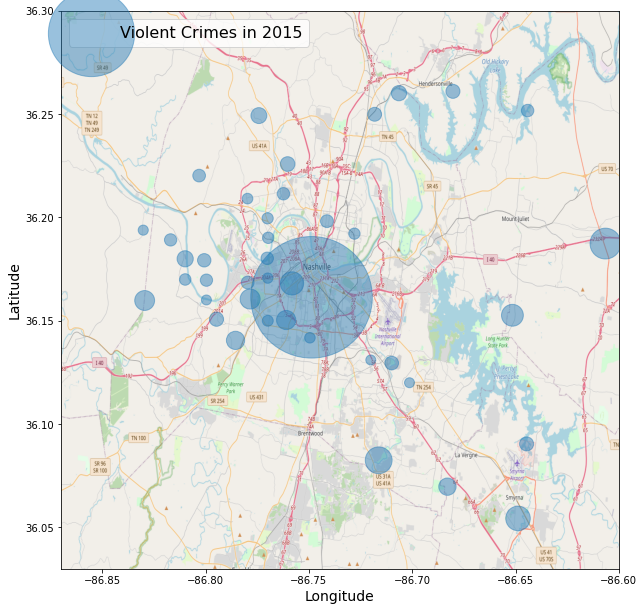

49
len clusters  28706 len incidents  (28706, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

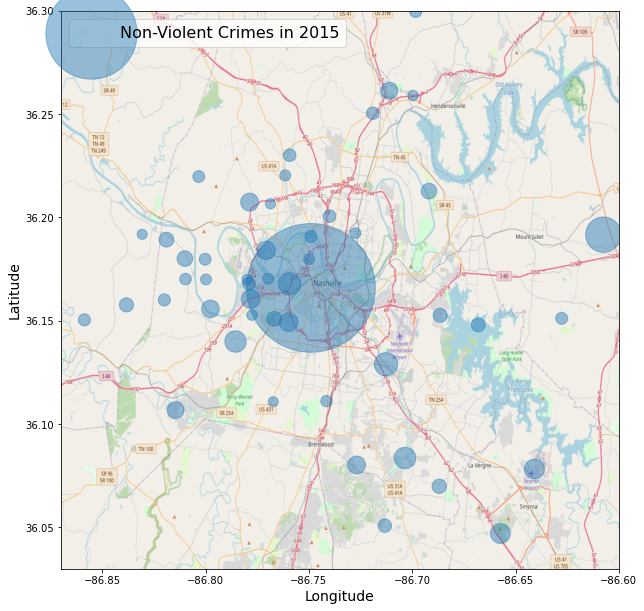

104
len clusters  35306 len incidents  (35306, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

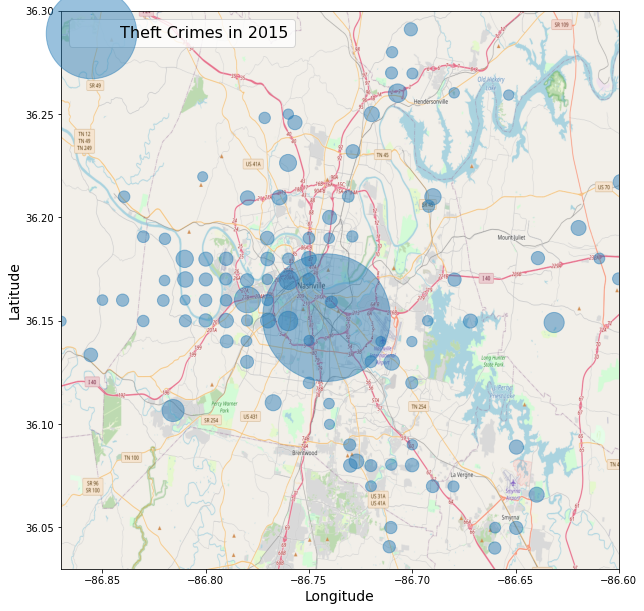

all incidents shape:  (119813, 33)
Violent incidents shape:  (25352, 33)
theft incidents shape:  (37539, 33)
Non-Violent incidents shape:  (29756, 33)
41
len clusters  25352 len incidents  (25352, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

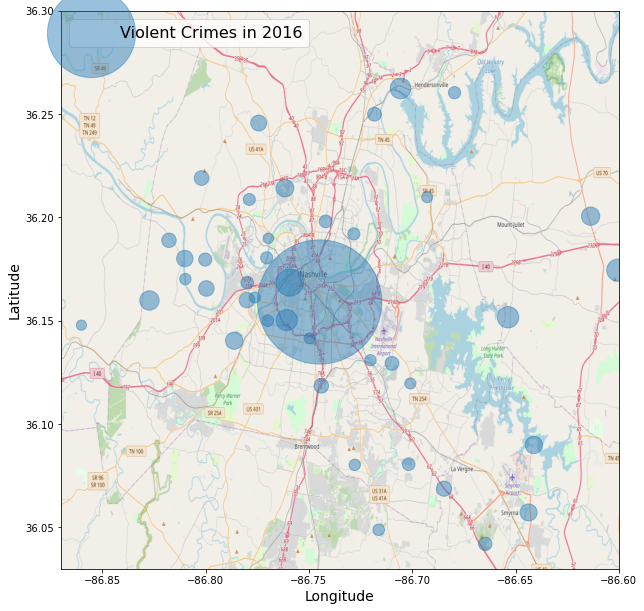

48
len clusters  29756 len incidents  (29756, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

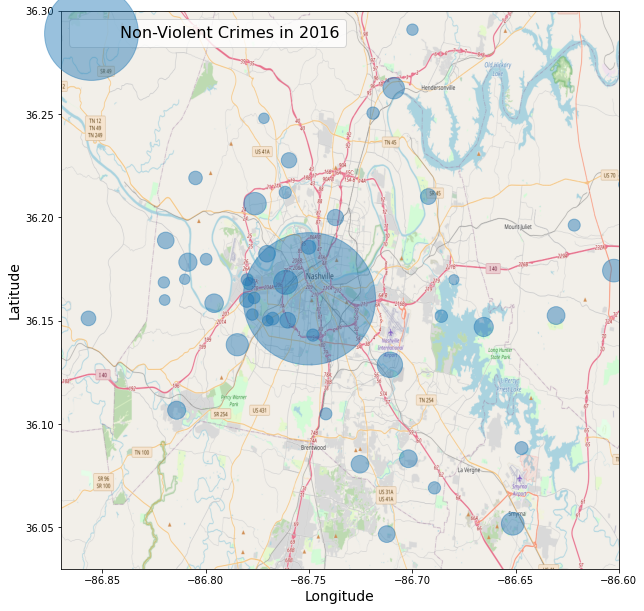

104
len clusters  37539 len incidents  (37539, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

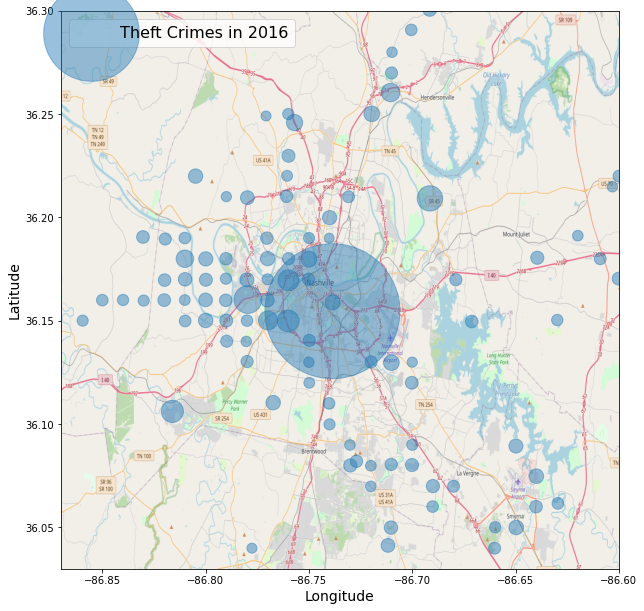

all incidents shape:  (121462, 33)
Violent incidents shape:  (24030, 33)
theft incidents shape:  (40087, 33)
Non-Violent incidents shape:  (29453, 33)
33
len clusters  24030 len incidents  (24030, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

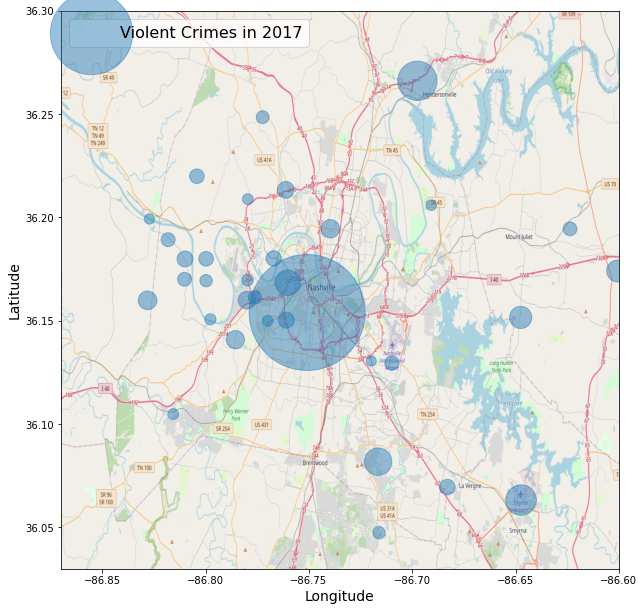

48
len clusters  29453 len incidents  (29453, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

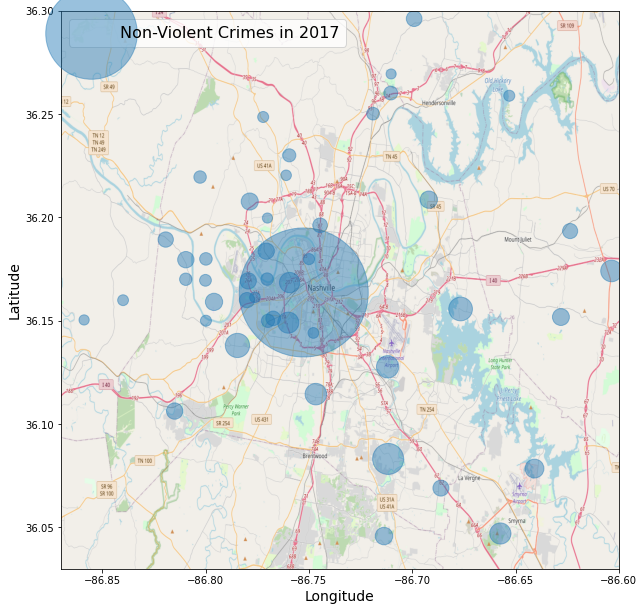

113
len clusters  40087 len incidents  (40087, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

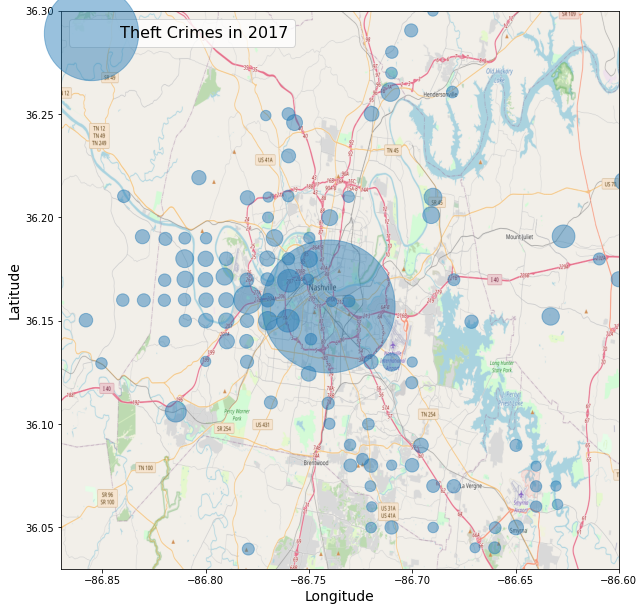

all incidents shape:  (122484, 33)
Violent incidents shape:  (23101, 33)
theft incidents shape:  (42663, 33)
Non-Violent incidents shape:  (27521, 33)
28
len clusters  23101 len incidents  (23101, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

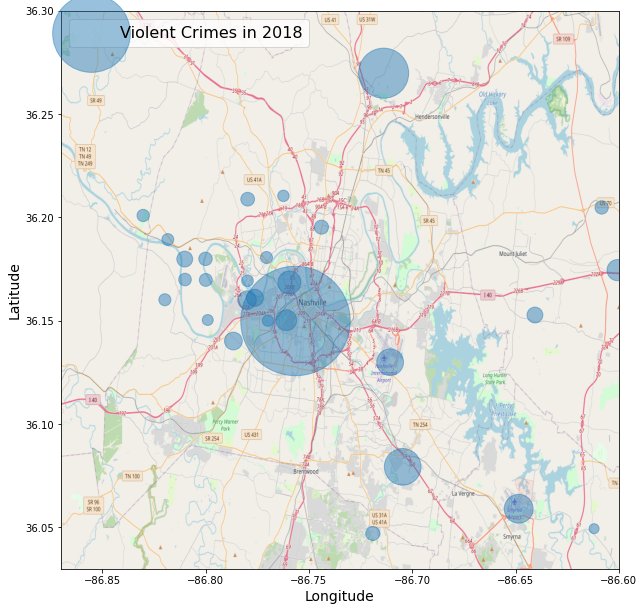

51
len clusters  27521 len incidents  (27521, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

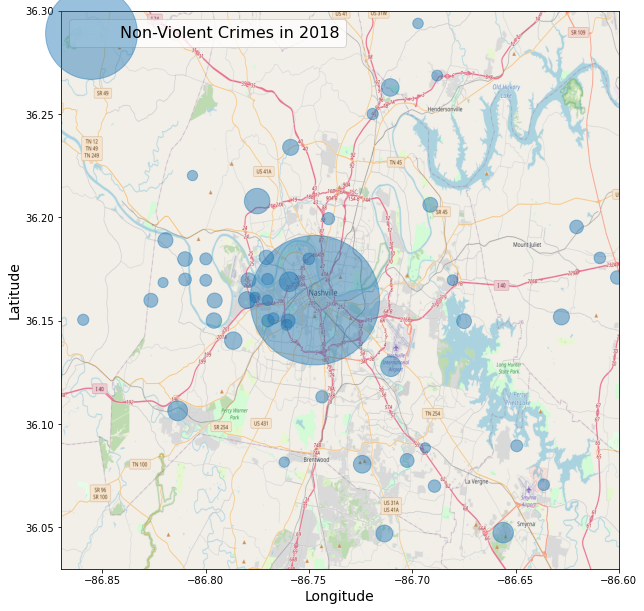

120
len clusters  42663 len incidents  (42663, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

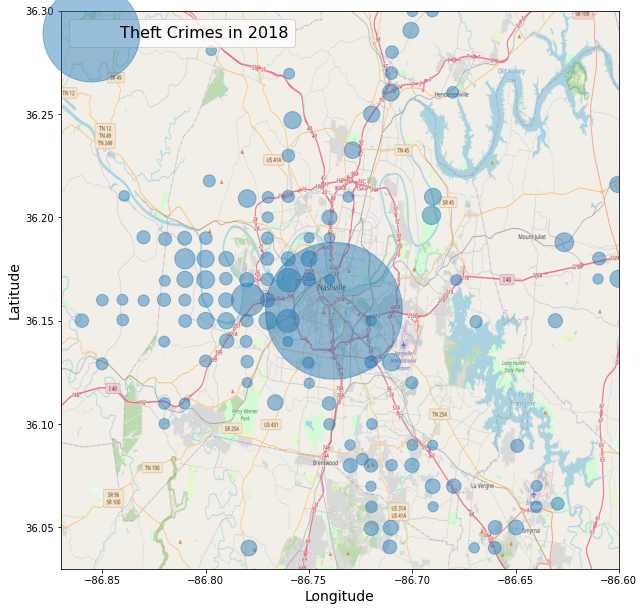

all incidents shape:  (118287, 33)
Violent incidents shape:  (23093, 33)
theft incidents shape:  (43946, 33)
Non-Violent incidents shape:  (22448, 33)
33
len clusters  23093 len incidents  (23093, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

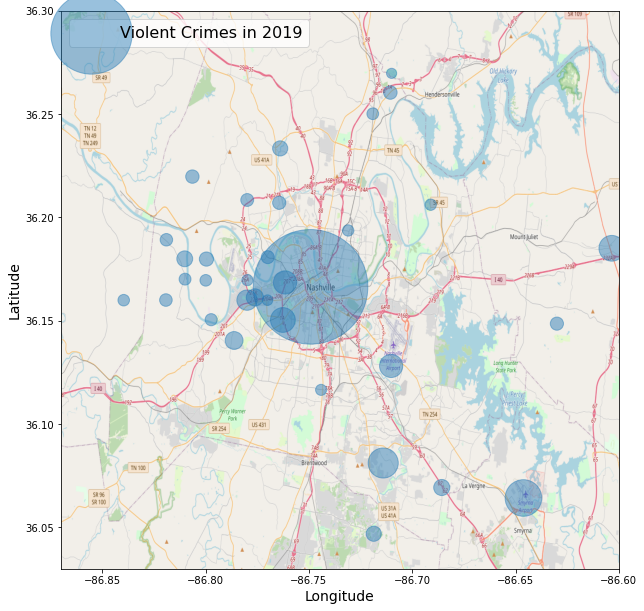

42
len clusters  22448 len incidents  (22448, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

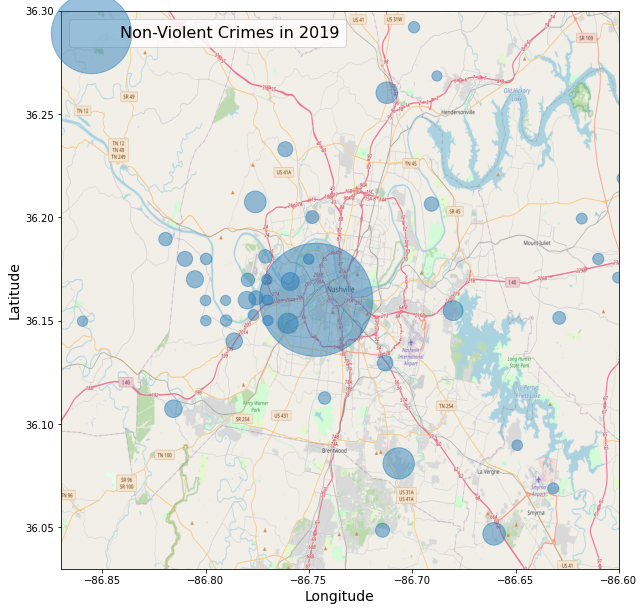

128
len clusters  43946 len incidents  (43946, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

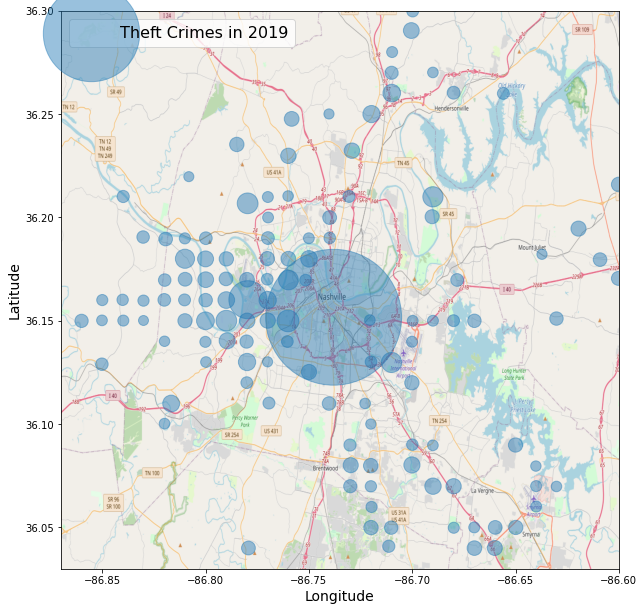

all incidents shape:  (117127, 33)
Violent incidents shape:  (23751, 33)
theft incidents shape:  (45459, 33)
Non-Violent incidents shape:  (20040, 33)
39
len clusters  23751 len incidents  (23751, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

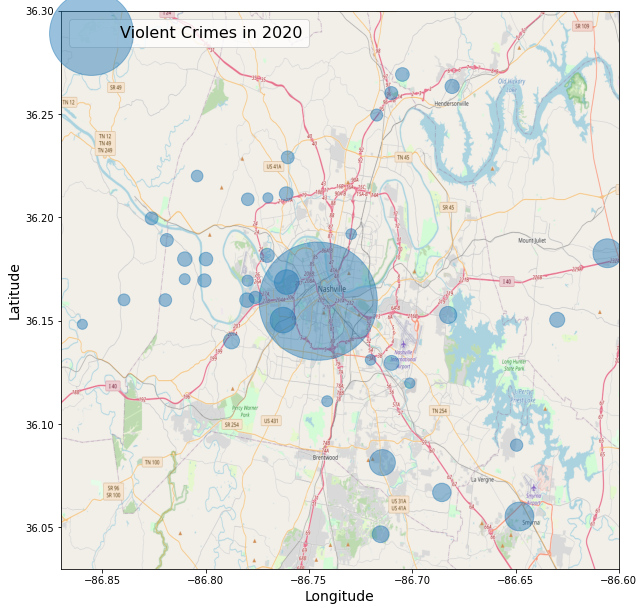

29
len clusters  20040 len incidents  (20040, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

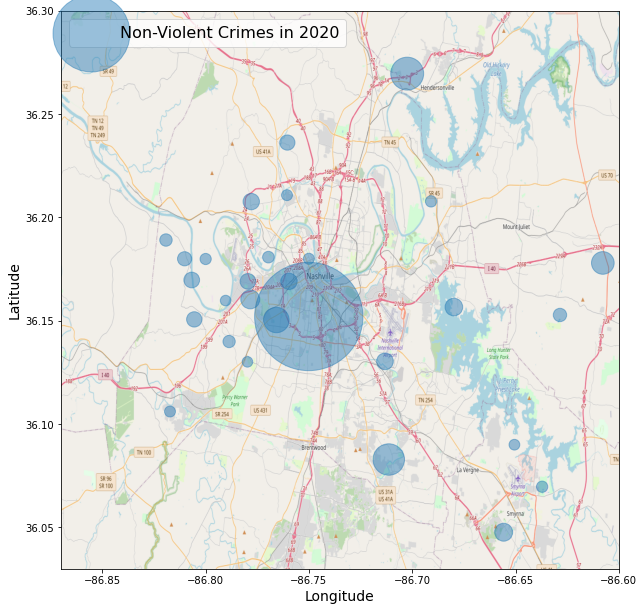

140
len clusters  45459 len incidents  (45459, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

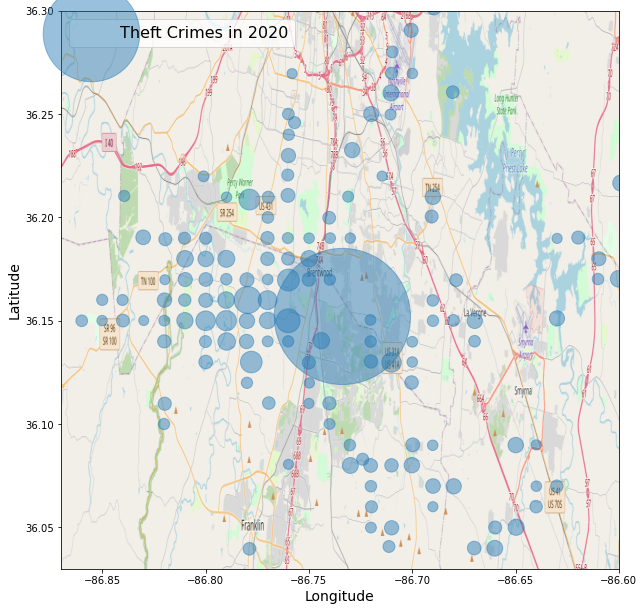

all incidents shape:  (113971, 33)
Violent incidents shape:  (24963, 33)
theft incidents shape:  (41372, 33)
Non-Violent incidents shape:  (19089, 33)
48
len clusters  24963 len incidents  (24963, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

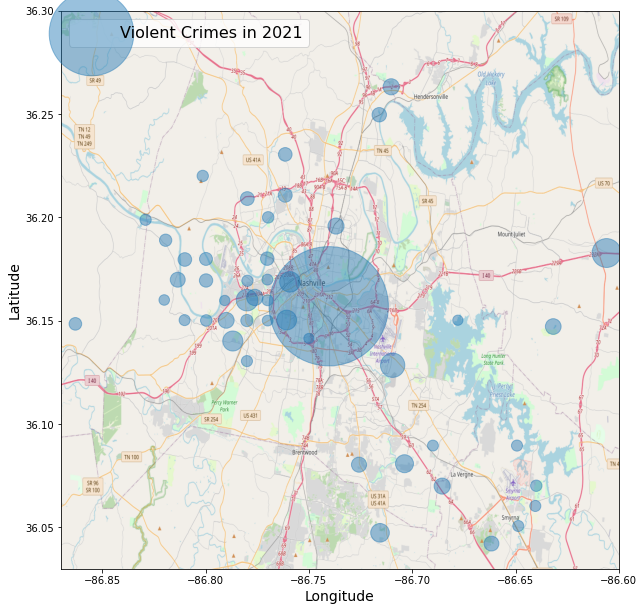

32
len clusters  19089 len incidents  (19089, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

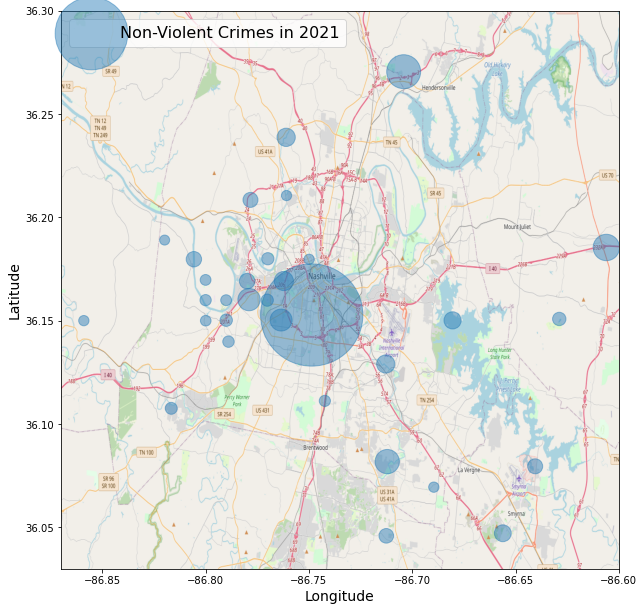

119
len clusters  41372 len incidents  (41372, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

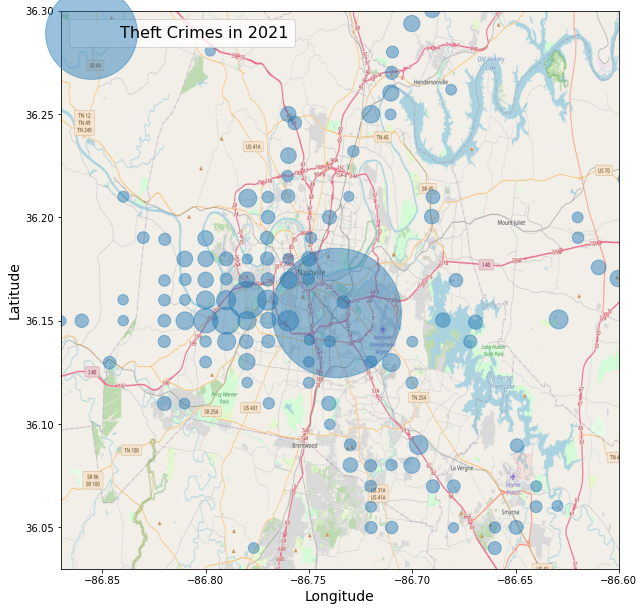

all incidents shape:  (32027, 33)
Violent incidents shape:  (6947, 33)
theft incidents shape:  (12031, 33)
Non-Violent incidents shape:  (5210, 33)
9
len clusters  6947 len incidents  (6947, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

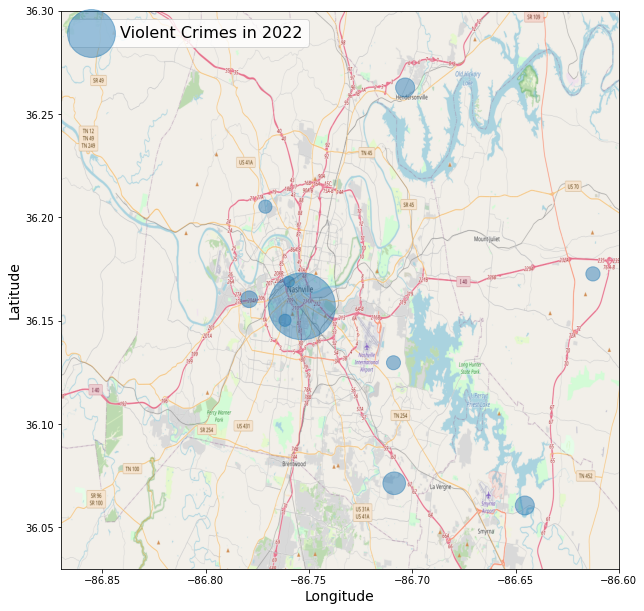

1
len clusters  5210 len incidents  (5210, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

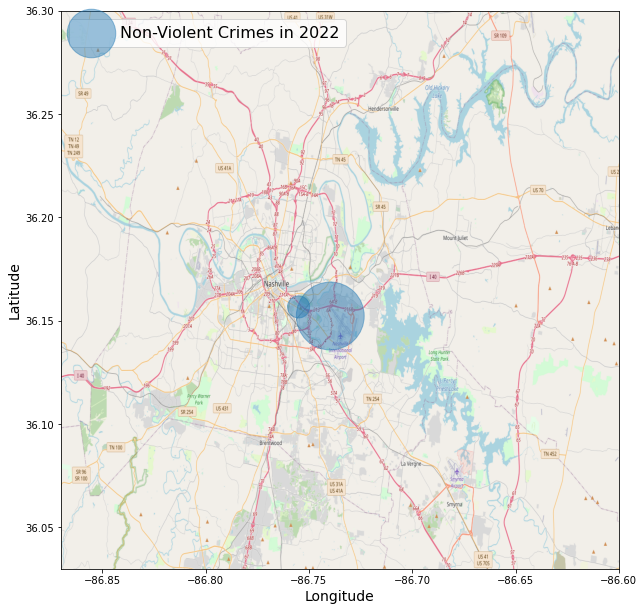

22
len clusters  12031 len incidents  (12031, 33)


C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['cluster'] = clusterLabels
C:\Users\jsamar1\AppData\Local\Temp/ipykernel_19228/2709814769.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  incidents['location'] = list(zip(incidents['Latitude'], incidents['Longitude']))


<Figure size 432x288 with 0 Axes>

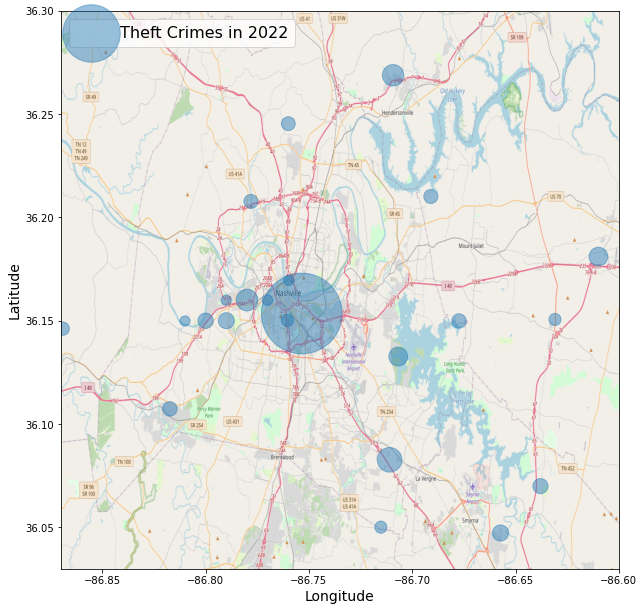

<Figure size 432x288 with 0 Axes>

In [189]:
years = [x+2015 for x in range(8)]

# years = [2019]

# params to explore for hdbscan
# sizes = [10, 25, 50, 75, 100, 125, 150, 200]
sizes = [100]
# 75, 90, 110
# # samples = [4, 8, 10, 15, 20, 30, 50, 75, 100, 125, 150]
samples = [100]

# sizes = [11]
# samples = [4]
for year in years:
    incidents = fetchYearOfIncidents(year)
    violentIncidents, nonViolentIncidents, theftIncidents = divideByCrimeType(incidents)
    for size in sizes:
        for sample in samples:
            clusterAndPlot(violentIncidents, 'Violent', year, size, sample)
            clusterAndPlot(nonViolentIncidents, 'Non-Violent', year, size, sample)
            clusterAndPlot(theftIncidents, 'Theft', year, size, sample)